In [12]:
! pip install torch torchvision albumentations tqdm

In [13]:
import os
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import yaml
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.patches as patches

import warnings
warnings.filterwarnings("ignore")

# Loading the data.yaml File

In [58]:
# Load data.yaml
with open("/kaggle/input/road-sign-dataset/Road_Sign_Detection  3/data.yaml", "r") as stream:
    data_config = yaml.safe_load(stream)


num_classes = data_config['nc']
class_names = data_config['names']

print(f"Number of Classes: {num_classes}")
print(f"Class Names: {class_names}")

Number of Classes: 25
Class Names: ['-Road narrows on right', 'Attention Please-', 'Beware of children', 'CYCLE ROUTE AHEAD WARNING', 'Crosswalk', 'Dangerous Left Curve Ahead', 'Dangerous Rright Curve Ahead', 'No Entry', 'No_Over_Taking', 'One way road', 'Speed bump ahead', 'Speed limit', 'Speed limit 100 Kph', 'Speed limit 120 Kph', 'Speed limit 20 Kph', 'Speed limit 30 Kph', 'Speed limit 40 Kph', 'Speed limit 50 Kph', 'Speed limit 60 Kph', 'Speed limit 70 Kph', 'Speed limit 80 Kph', 'Speed limit 90 Kph', 'Stop_Sign', 'Uneven Road', 'roundabout']


# Creating a Class for Loading the DataSet in Proper Format

In [62]:
# class RoadSignDataset(Dataset):
#     def __init__(self, root_dir, yaml_file, mode='train', transform=None):
#         """
#         Args:
#             root_dir (str): Root directory containing the data
#             yaml_file (str): Path to data.yaml file|
#             mode (str): 'train', 'valid', or 'test'
#             transform: Optional transform to be applied
#         """
#         self.root_dir = root_dir
#         self.mode = mode
#         self.transform = transform
        
#         # Load yaml file
#         with open(yaml_file, 'r') as f:
#             self.yaml_data = yaml.safe_load(f)
            
#         self.num_classes = len(self.yaml_data['names'])
#         self.class_names = self.yaml_data['names']
        
#         # Set up paths based on mode
#         self.img_dir = os.path.join(root_dir, mode, 'images')
#         self.label_dir = os.path.join(root_dir, mode, 'labels')
        
#         # Get all image files
#         self.img_files = [f for f in os.listdir(self.img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        
#         if len(self.img_files) == 0:
#             raise ValueError(f"No images found in {self.img_dir}")
            
#         print(f"Found {len(self.img_files)} images in {mode} set")
    
#     def __len__(self):
#         return len(self.img_files)
    
#     def __getitem__(self, idx):
#         img_name = self.img_files[idx]
#         img_path = os.path.join(self.img_dir, img_name)
        
#         # Load image
#         image = Image.open(img_path).convert('RGB')
        
#         if self.transform:
#             image = self.transform(image)
        
#         # Load labels
#         label_path = os.path.join(self.label_dir, img_name.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))
#         boxes = []
#         labels = []
        
#         if os.path.exists(label_path):
#             with open(label_path, 'r') as f:
#                 for line in f:
#                     class_id, x_center, y_center, width, height = map(float, line.strip().split())
#                     # Convert YOLO format to [x_min, y_min, x_max, y_max]
#                     x_min = (x_center - width/2)
#                     y_min = (y_center - height/2)
#                     x_max = (x_center + width/2)
#                     y_max = (y_center + height/2)
#                     boxes.append([x_min, y_min, x_max, y_max])
#                     labels.append(int(class_id))
        
#         # Convert to tensors
#         boxes = torch.as_tensor(boxes, dtype=torch.float32)
#         labels = torch.as_tensor(labels, dtype=torch.int64)
        
#         target = {}
#         target["boxes"] = boxes
#         target["labels"] = labels
        
#         return image, target


# please Leave this Class as it is , this may be used later

# class RoadSignDataset(Dataset):
#     def __init__(self, root_dir, yaml_file, mode='train', transform=None):
#         """
#         Args:
#             root_dir (str): Root directory containing the data
#             yaml_file (str): Path to data.yaml file
#             mode (str): 'train', 'valid', or 'test'
#             transform: Optional transform to be applied
#         """
#         self.root_dir = root_dir
#         self.mode = mode
#         self.transform = transform
        
#         # Load yaml file
#         with open(yaml_file, 'r') as f:
#             self.yaml_data = yaml.safe_load(f)
            
#         self.num_classes = len(self.yaml_data['names'])
#         self.class_names = self.yaml_data['names']
        
#         # Set up paths based on mode
#         self.img_dir = os.path.join(root_dir, mode, 'images')
#         self.label_dir = os.path.join(root_dir, mode, 'labels')
        
#         # Get all image files
#         self.img_files = [f for f in os.listdir(self.img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        
#         if len(self.img_files) == 0:
#             raise ValueError(f"No images found in {self.img_dir}")
            
#         print(f"Found {len(self.img_files)} images in {mode} set")
    
#     def __len__(self):
#         return len(self.img_files)
    
#     def __getitem__(self, idx):
#         img_name = self.img_files[idx]
#         img_path = os.path.join(self.img_dir, img_name)
        
#         # Load and convert image to RGB
#         image = Image.open(img_path).convert('RGB')
        
#         # Get image dimensions before transform
#         width, height = image.size
        
#         if self.transform:
#             image = self.transform(image)
        
#         # For test set, return only image and filename
# #         if self.mode == 'test':
# #             # Create dummy target for test set to maintain consistency
# #             target = {
# #                 "boxes": torch.tensor([[0, 0, 1, 1]], dtype=torch.float32),
# #                 "labels": torch.tensor([0], dtype=torch.int64)
# #             }
# #             return image, img_name, target
        
#         # Load labels
#         label_path = os.path.join(self.label_dir, img_name.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))
#         boxes = []
#         labels = []
        
#         if os.path.exists(label_path):
#             with open(label_path, 'r') as f:
#                 for line in f:
#                     try:
#                         class_id, x_center, y_center, width_norm, height_norm = map(float, line.strip().split())
                        
#                         # Convert normalized YOLO format to absolute coordinates
#                         x_min = (x_center - width_norm/2) * width
#                         y_min = (y_center - height_norm/2) * height
#                         x_max = (x_center + width_norm/2) * width
#                         y_max = (y_center + height_norm/2) * height
                        
#                         # Ensure boxes are within image boundaries
#                         x_min = max(0, min(width, x_min))
#                         y_min = max(0, min(height, y_min))
#                         x_max = max(0, min(width, x_max))
#                         y_max = max(0, min(height, y_max))
                        
#                         # Only add valid boxes
#                         if x_max > x_min and y_max > y_min:
#                             boxes.append([x_min, y_min, x_max, y_max])
#                             labels.append(int(class_id))
#                     except Exception as e:
#                         print(f"Error processing label in {label_path}: {e}")
#                         continue
        
#         # If no valid boxes were found, create a dummy box and background label
#         if len(boxes) == 0:
#             boxes = [[0, 0, width, height]]  # Full image box
#             labels = [self.num_classes]  # Use num_classes as background class
        
#         # Convert to tensors
#         boxes = torch.tensor(boxes, dtype=torch.float32)
#         labels = torch.tensor(labels, dtype=torch.int64)
        
#         # Create target dictionary
#         target = {
#             "boxes": boxes,
#             "labels": labels
#         }
        
#         return image, target
    
#     def get_height_and_width(self, idx):
#         """Helper method to get image dimensions"""
#         img_name = self.img_files[idx]
#         img_path = os.path.join(self.img_dir, img_name)
#         with Image.open(img_path) as img:
#             return img.size[1], img.size[0]  # height, width

# def collate_fn(batch):
#     """Custom collate function for the DataLoader"""
#     return tuple(zip(*batch))

In [63]:
def get_transform(train=True):
    """Define transformations for training and validation/testing"""
    transforms_list = []
    transforms_list.append(transforms.ToTensor())
    
    if train:
        transforms_list.extend([
            transforms.RandomHorizontalFlip(0.5),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))
        ])
    
    return transforms.Compose(transforms_list)


def collate_fn(batch):
    """Custom collate function for the DataLoader"""
    return tuple(zip(*batch))

In [ ]:
 # Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
# Define base path
base_path = '/kaggle/input/road-sign-dataset/Road_Sign_Detection  3'
yaml_path = os.path.join(base_path, 'data.yaml')
    
# Initialize datasets with correct paths
train_dataset = RoadSignDataset(base_path, yaml_path, mode='train', transform=get_transform(train=True))
valid_dataset = RoadSignDataset(base_path, yaml_path, mode='valid', transform=get_transform(train=False))
test_dataset = RoadSignDataset(base_path, yaml_path, mode='test', transform=get_transform(train=False))
    
# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)

In [18]:
!pip install ultralytics
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()
import yaml
from ultralytics import YOLO
import logging

# Suppress warnings and reduce logging output
logging.getLogger("ultralytics").setLevel(logging.ERROR)

In [19]:
!pip install wandb
from IPython import display
display.clear_output()
!wandb --version

wandb, version 0.18.3


In [20]:
# Import wandb
import wandb

try:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    secret_value_0 = user_secrets.get_secret("My_Wandb")
    wandb.login(secret_value_0)

    anony=None
except:
    anony = "must"
    print('If you want to use your W&B account, go to Add-ons -> Secrets and add your W&B access token.')

If you want to use your W&B account, go to Add-ons -> Secrets and add your W&B access token.


# Making a Directory for the Resultant files and images

In [21]:
from glob import glob
import os
import shutil
from ultralytics import YOLO

def make_directory(source_folder, destination_folder):
    os.makedirs(destination_folder, exist_ok=True)
    files = glob(f"{source_folder}/*")
    for file in files:
        if os.path.isdir(file):
            shutil.copytree(file, os.path.join(destination_folder, os.path.basename(file)))
        elif os.path.isfile(file):
            shutil.copy(file, destination_folder)

source_folder = "/kaggle/input/detection"
destination_folder = '/kaggle/working/detection'

make_directory(source_folder, destination_folder)
print("Folder structure created successfully!")

Folder structure created successfully!


# Q11 Using PreTrained Model YOLOv8

In [22]:
model = YOLO(f'yolov8n.pt')

results = model.train(
    data = '/kaggle/input/road-sign-dataset/Road_Sign_Detection  3/data.yaml',
    epochs = 10,
    imgsz=640,
    device="cuda",
    patience=50,
    batch = 32,
    optimizer='auto',
    lr0 = 0.001,
    lrf=0.1,
    seed=0,
    dropout=0.2,
    plots=True,)

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


100%|██████████| 5.35M/5.35M [00:00<00:00, 66.2MB/s]
train: Scanning /kaggle/input/road-sign-dataset/Road_Sign_Detection  3/train/labels... 5316 images, 12 backgrounds, 0 corrupt: 100%|██████████| 5316/5316 [00:26<00:00, 204.33it/s]
val: Scanning /kaggle/input/road-sign-dataset/Road_Sign_Detection  3/valid/labels... 621 images, 1 backgrounds, 0 corrupt: 100%|██████████| 621/621 [00:03<00:00, 184.92it/s]
       1/10      4.18G     0.7936      3.819      1.258          5        640: 100%|██████████| 167/167 [00:59<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]
       2/10      4.11G     0.6946      2.172      1.147          5        640: 100%|██████████| 167/167 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.60it/s]
       3/10      4.14G     0.6721      1.669      1.123    

lr/pg0,▃▆█▇▆▅▄▃▂▁
lr/pg1,▃▆█▇▆▅▄▃▂▁
lr/pg2,▃▆█▇▆▅▄▃▂▁
metrics/mAP50(B),▁▅▆▆▇▇████
metrics/mAP50-95(B),▁▅▅▆▇▇▇███
metrics/precision(B),▁▆▅▅▇▇████
metrics/recall(B),▁▄▅▆▇▇▇███
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▅▅▄▄▃▃▂▂▁


In [ ]:
# Saving the model
torch.save(
      model.state_dict(),
    "best.pt")

# Computing the Iou score and the predicted image

In [23]:
# Function to calculate IoU between two bounding boxes
def compute_iou(box1, box2, normalize=True, image_size=(640, 640)):
    try:
        box1 = np.array(box1, dtype=np.float32)
        box2 = np.array(box2, dtype=np.float32)
        
        # Check if boxes need normalization/denormalization
        box1_normalized = np.all(box1 <= 1.0)
        box2_normalized = np.all(box2 <= 1.0)
        
        # Convert both boxes to the same scale
        if normalize:
            # Convert to normalized coordinates (0-1)
            if not box1_normalized:
                box1 = box1 / np.array([image_size[0], image_size[1], image_size[0], image_size[1]])
            if not box2_normalized:
                box2 = box2 / np.array([image_size[0], image_size[1], image_size[0], image_size[1]])
        else:
            # Convert to absolute coordinates
            if box1_normalized:
                box1 = box1 * np.array([image_size[0], image_size[1], image_size[0], image_size[1]])
            if box2_normalized:
                box2 = box2 * np.array([image_size[0], image_size[1], image_size[0], image_size[1]])
        
        
        # Calculate intersection
        x1 = max(box1[0], box2[0])
        y1 = max(box1[1], box2[1])
        x2 = min(box1[2], box2[2])
        y2 = min(box1[3], box2[3])
        
        intersection = max(0, x2 - x1) * max(0, y2 - y1)
        box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
        box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
        union = box1_area + box2_area - intersection
        
        iou = intersection / union if union > 0 else 0
        return float(iou)
    except Exception as e:
        print(f"Error calculating IoU: {e}")
        return 0.0

In [39]:
import os
import pandas as pd
from pathlib import Path
from ultralytics import YOLO

# Folder paths
test_image_folder = '/kaggle/input/road-sign-dataset/Road_Sign_Detection  3/test/images'
test_label_folder = '/kaggle/input/road-sign-dataset/Road_Sign_Detection  3/test/labels'
output_folder = '/kaggle/working/'


# Class names dictionary
class_names = {
    0: 'Road narrows on right', 1: 'Attention Please', 2: 'Beware of children',
    3: 'CYCLE ROUTE AHEAD WARNING', 4: 'Crosswalk', 5: 'Dangerous Left Curve Ahead',
    6: 'Dangerous Right Curve Ahead', 7: 'No Entry', 8: 'No Over Taking',
    9: 'One way road', 10: 'Speed bump ahead', 11: 'Speed limit',
    12: 'Speed limit 100 Kph', 13: 'Speed limit 120 Kph', 14: 'Speed limit 20 Kph',
    15: 'Speed limit 30 Kph', 16: 'Speed limit 40 Kph', 17: 'Speed limit 50 Kph',
    18: 'Speed limit 60 Kph', 19: 'Speed limit 70 Kph', 20: 'Speed limit 80 Kph',
    21: 'Speed limit 90 Kph', 22: 'Stop Sign', 23: 'Uneven Road', 24: 'roundabout'
}


# Create lists for storing results for CSVs
iou_results = []
bbox_results = []

# Loop through test images

def evaluate(model):
    
    test_images = Path(test_image_folder).glob("*.jpg")
    for img_path in test_images:
        img_id = img_path.stem  # Get image ID (file name without extension)
    
        # Predict on the image
        results = model.predict(img_path)
    
        # Load ground truth labels
        label_path = Path(test_label_folder) / f"{img_id}.txt"
        with open(label_path, 'r') as f:
            ground_truths = [list(map(float, line.strip().split())) for line in f.readlines()]
    
        # Iterate over predictions
        for pred in results[0].boxes:
            pred_box = pred.xyxy[0].cpu().numpy()  # Predicted bounding box (x1, y1, x2, y2)
            pred_class_id = int(pred.cls[0])  # Predicted class ID
            pred_class_name = class_names[pred_class_id]  # Map ID to class name
    
            # Find the best matching ground truth for IoU
            best_iou = 0
            for gt in ground_truths:
                gt_class_id, gt_xc, gt_yc, gt_w, gt_h = gt  # Ground truth box in (class_id, center_x, center_y, w, h)
                gt_class_id = int(gt_class_id)
    
                # Convert GT box to (x1, y1, x2, y2) format
                gt_x1 = gt_xc - gt_w / 2
                gt_y1 = gt_yc - gt_h / 2
                gt_x2 = gt_xc + gt_w / 2
                gt_y2 = gt_yc + gt_h / 2
                gt_box = [gt_x1, gt_y1, gt_x2, gt_y2]
    
                iou = compute_iou(pred_box, gt_box)
                if iou > best_iou:
                    best_iou = iou
    
            # Append IoU and class name to the iou_results list
            iou_results.append({
                'image_id': img_id,
                'class': pred_class_name,
                'iou': best_iou
            })
    
            # Append predicted bounding box to the bounding box list
            bbox_results.append({
                'image_id': img_id,
                'x1': pred_box[0], 'y1': pred_box[1], 'x2': pred_box[2], 'y2': pred_box[3],
                'pred_class': pred_class_name
            })
    
    # Save IoU results CSV file
    iou_df = pd.DataFrame(iou_results)
    iou_df.to_csv(f"{output_folder}/predictions_iou.csv", index=False)
    
    average_iou = iou_df['iou'].mean()
    print(f"\nEvaluation Summary:")
    print(f"Total images processed: {len(iou_df)}")
    print(f"Average IoU: {average_iou:.4f}")
    print(f"Max IoU: {iou_df['iou'].max():.4f}")
    print(f"Min IoU: {iou_df['iou'].min():.4f}")
    
    # Save all predicted bounding boxes in a separate CSV file
    bbox_df = pd.DataFrame(bbox_results)
    bbox_df.to_csv(f"{output_folder}/predicted_bounding_boxes.csv", index=False)

In [25]:
evaluate(model)


Evaluation Summary:
Total images processed: 835
Average IoU: 0.8750
Max IoU: 0.9989
Min IoU: 0.0000


# Making Prediction on Test Images

In [30]:
import cv2
import random
# Path to validation images
dataset_path = '/kaggle/input/road-sign-dataset/Road_Sign_Detection  3'  # Place your dataset path here
test_images_path = os.path.join(dataset_path, 'test', 'images')


def predict_random_images(dataset_path, model, num_images=9):
    """
    Randomly select and predict on images from the test set
    
    Parameters:
    dataset_path (str): Path to the dataset
    model: The trained model to use for predictions
    num_images (int): Number of images to predict (default=9)
    """
    # Path to test images
    test_images_path = os.path.join(dataset_path, 'test', 'images')
    
    # Get list of all jpg images
    image_files = [file for file in os.listdir(test_images_path) if file.endswith('.jpg')]
    
    # Check if there are enough images
    if len(image_files) == 0:
        print("No images found in the specified directory")
        return
    
    # Randomly select images
    num_samples = min(num_images, len(image_files))
    selected_images = random.sample(image_files, num_samples)
    
    # Calculate grid dimensions
    grid_size = int(np.ceil(np.sqrt(num_samples)))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20))
    fig.suptitle('Random Test Set Predictions', fontsize=24)
    
    # Flatten axes for easier iteration
    axes_flat = axes.flatten()
    
    # Process each selected image
    for i, (image_file, ax) in enumerate(zip(selected_images, axes_flat)):
        image_path = os.path.join(test_images_path, image_file)
        
        # Load and process image
        image = cv2.imread(image_path)
        if image is not None:
            # Resize and normalize
            resized_image = cv2.resize(image, (640, 640))
            normalized_image = resized_image / 255.0
            
            # Convert to uint8 for model
            normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
            
            # Get predictions
            results = model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
            
            # Plot with annotations
            annotated_image = results[0].plot(line_width=1)
            annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
            
            # Display image
            ax.imshow(annotated_image_rgb)
            ax.set_title(f"Image: {image_file}", fontsize=10)
        else:
            print(f"Failed to load image: {image_path}")
        
        ax.axis('off')
    
    # Turn off any unused subplots
    for j in range(i + 1, len(axes_flat)):
        axes_flat[j].axis('off')
    
    plt.tight_layout()
    plt.show()

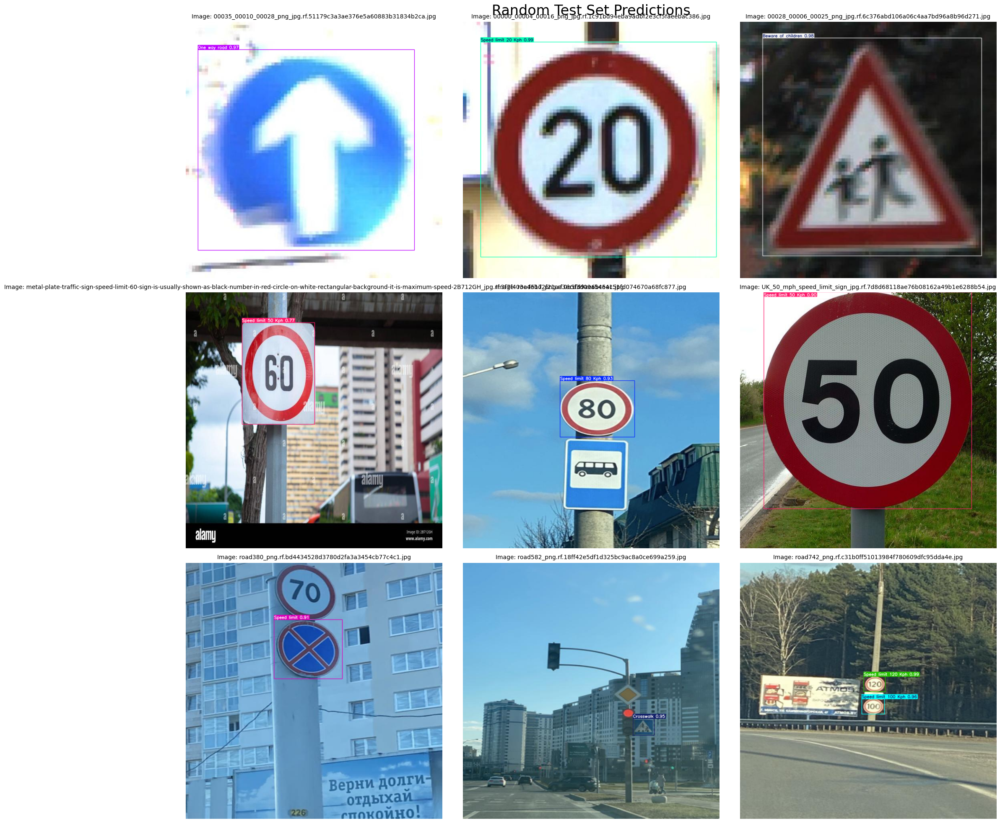

In [34]:
predict_random_images(dataset_path='/kaggle/input/road-sign-dataset/Road_Sign_Detection  3', model=model)

# Q12 Expermenting with the models to get the Best result 

# YOLOV8  (Frezzing anf Unfrezzing the layers of Pretrained model and using learning rate as 0.0005 )

In [37]:
model = YOLO('yolov8n.pt')

#  Freezing all layers except the last 2
# for layer in model.model.children():
#     layer.requires_grad = False  # Freeze all layers


# Unfreeze the last few layers (e.g., the last 2)
for layer in list(model.model.children())[-2:]:
    layer.requires_grad = True  

# Specify your desired learning rate
learning_rate = 0.0005

# Train the model with the modified layer settings
results = model.train(
    data='/kaggle/input/road-sign-dataset/Road_Sign_Detection  3/data.yaml',
    epochs=20,
    imgsz=640,
    device="cuda",
    patience=50,
    batch=32,
    optimizer='auto',
    lr0=learning_rate,
    lrf=0.1,
    seed=0,
    dropout=0.3,
    plots=True,
)

train: Scanning /kaggle/input/road-sign-dataset/Road_Sign_Detection  3/train/labels... 5316 images, 12 backgrounds, 0 corrupt: 100%|██████████| 5316/5316 [00:06<00:00, 857.03it/s]
val: Scanning /kaggle/input/road-sign-dataset/Road_Sign_Detection  3/valid/labels... 621 images, 1 backgrounds, 0 corrupt: 100%|██████████| 621/621 [00:00<00:00, 633.06it/s]
       1/20      4.71G     0.8685        3.5       1.29         11        640: 100%|██████████| 167/167 [00:58<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.69it/s]
       2/20      4.21G      0.789      2.081        1.2         10        640: 100%|██████████| 167/167 [00:57<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.63it/s]
       3/20      4.19G     0.7562      1.625      1.168          7        640: 100%|██████████| 167/167 [00:56<0

lr/pg0,▃▅██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg1,▃▅██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg2,▃▅██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
metrics/mAP50(B),▁▅▆▆▇▇▇▇▇███████████
metrics/mAP50-95(B),▁▅▅▆▆▇▇▇▇███████████
metrics/precision(B),▁▅▆▆▇▇▇▇▇███████████
metrics/recall(B),▁▄▄▅▆▆▇▇▆▇▇▇█▇██▇███
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▆▆▅▅▅▅▅▄▃▃▂▂▂▂▂▁▁▁


In [ ]:
# Saving the model
torch.save(
      model.state_dict(),
    "best11.pt")

In [48]:
evaluate(model) #best result for yolo model

Evaluation Summary:
Total images processed: 836
Average IoU: 0.9189
Max IoU: 1.0
Min IoU: 0.0


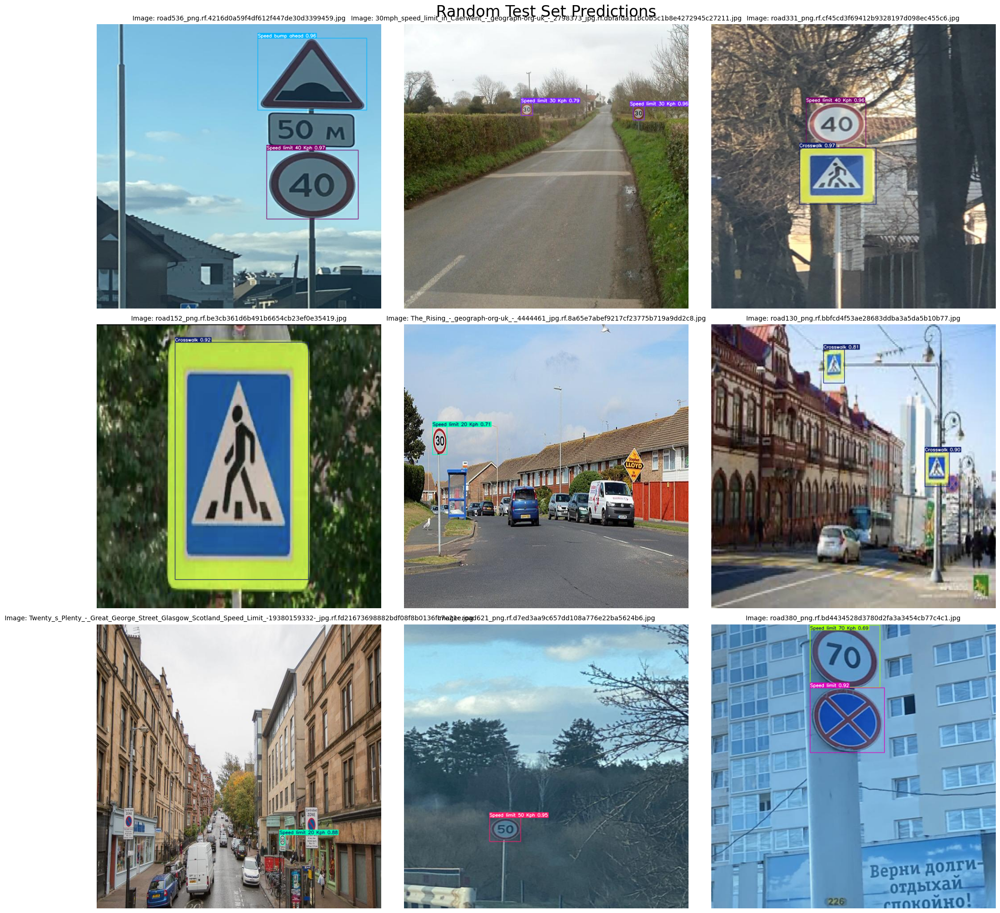

In [49]:
predict_random_images(dataset_path='/kaggle/input/road-sign-dataset/Road_Sign_Detection  3', model=model)

# Experimenting with Fast_RCNN 

In [65]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from tqdm.notebook import tqdm
import matplotlib.patches as patches
import time


def train_batch(inputs, model, optimizer):
    model.train()
    input, targets = inputs
    input = list(image.to(device) for image in input)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    optimizer.zero_grad()
    losses = model(input, targets)
    loss = sum(loss for loss in losses.values())
    loss.backward()
    optimizer.step()
    return loss, losses

@torch.no_grad() # this will disable gradient computation in the function below
def validate_batch(inputs, model):
    model.train() # to obtain the losses, model needs to be in train mode only. # #Note that here we are not defining the model's forward method 
    #and hence need to work per the way the model class is defined
    input, targets = inputs
    input = list(image.to(device) for image in input)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    optimizer.zero_grad()
    losses = model(input, targets)
    loss = sum(loss for loss in losses.values())
    return loss, losses

# Unfreezing the layers and trying  learning rate as 0.0005

In [66]:
# Initialize model
model = fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = train_dataset.num_classes + 1  # +1 for background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model = model.to(device)

# Freeze backbone layers (only train the ROI heads)
for param in model.backbone.parameters():
    param.requires_grad = False

# Train with a specific learning rate
optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0005, momentum=0.9)

# Train model
print("Starting training pipeline...")
print(f"Device being used: {device}")
print(f"Number of classes: {train_dataset.num_classes}")
print("\nDataset sizes:")
print(f"Training: {len(train_dataset)} images")
print(f"Validation: {len(valid_dataset)} images")
print(f"Test: {len(test_dataset)} images")

n_epochs = 15
best_valid_loss = float("inf")
patience = 8  # Number of epochs to wait for improvement
patience_counter = 0

for epoch in range(n_epochs):
    _n = len(train_loader)

    for ix, inputs in enumerate(train_loader):

        loss, losses = train_batch(inputs, model, optimizer)
        loc_loss, regr_loss, loss_objectness, loss_rpn_box_reg = \
                [losses[k] for k in ['loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg']]
        pos = (epoch + (ix + 1) / _n)
        
            # Print training loss details
    print(f"Epoch {epoch + 1}/{n_epochs}, "
                  f"Loss: {loss.item():.4f}, "
                  f"Loc Loss: {loc_loss.item():.4f}, "
                  f"Regr Loss: {regr_loss.item():.4f}, "
                  f"Objectness Loss: {loss_objectness.item():.4f}, "
                  f"RPN Box Reg Loss: {loss_rpn_box_reg.item():.4f}", end='\n')
        


    _n = len(valid_loader)
    for ix, inputs in enumerate(valid_loader):
        loss, losses = validate_batch(inputs, model)
        loc_loss, regr_loss, loss_objectness, loss_rpn_box_reg = \
            [losses[k] for k in ['loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg']]
        pos = (epoch + (ix + 1) / _n)

    # Save the best model
    if loss < best_valid_loss:
        best_valid_loss = loss
        torch.save(model.state_dict(), "tut2-model.pt")
        patience_counter = 0  # Reset the patience counter if validation loss improves
    else:
        patience_counter += 1

        # Print validation loss details
    print(f'Epoch {epoch + 1}/{n_epochs}, '
              f"Val Loss: {loss.item():.4f}, "
              f"Val Loc Loss: {loc_loss.item():.4f}, "
              f"Val Regr Loss: {regr_loss.item():.4f}, "
              f"Val Objectness Loss: {loss_objectness.item():.4f}, "
              f"Val RPN Box Reg Loss: {loss_rpn_box_reg.item():.4f}", end='\n')

    if patience_counter >= patience:
        print("\nEarly stopping triggered")
        break


# Saving the weights of the model
torch.save( model.state_dict(), 'final_model.pth')

Starting training pipeline...
Device being used: cuda
Number of classes: 25

Dataset sizes:
Training: 5316 images
Validation: 621 images
Test: 622 images
Epoch 1/15, Loss: 0.4562, Loc Loss: 0.2348, Regr Loss: 0.1994, Objectness Loss: 0.0190, RPN Box Reg Loss: 0.0031
Epoch 1/15, Val Loss: 0.2012, Val Loc Loss: 0.1077, Val Regr Loss: 0.0799, Val Objectness Loss: 0.0072, Val RPN Box Reg Loss: 0.0064
Epoch 2/15, Loss: 0.3198, Loc Loss: 0.1822, Regr Loss: 0.1215, Objectness Loss: 0.0140, RPN Box Reg Loss: 0.0020
Epoch 2/15, Val Loss: 0.1754, Val Loc Loss: 0.1009, Val Regr Loss: 0.0563, Val Objectness Loss: 0.0105, Val RPN Box Reg Loss: 0.0077
Epoch 3/15, Loss: 0.2090, Loc Loss: 0.1342, Regr Loss: 0.0703, Objectness Loss: 0.0029, RPN Box Reg Loss: 0.0017
Epoch 3/15, Val Loss: 0.1662, Val Loc Loss: 0.1024, Val Regr Loss: 0.0528, Val Objectness Loss: 0.0033, Val RPN Box Reg Loss: 0.0077
Epoch 4/15, Loss: 0.1911, Loc Loss: 0.1246, Regr Loss: 0.0465, Objectness Loss: 0.0190, RPN Box Reg Loss: 0.

In [69]:
def evaluate_test_set(model, test_loader, device='cuda', class_names=None):
    """
    Evaluate model on test set and create results CSV and bbox coordinate files
    Args:
        model: The model to evaluate
        test_loader: DataLoader containing images and targets
        device: Device to run evaluation on
        class_names: Dictionary mapping class indices to class names
    """
    if class_names is None:
        class_names = {
            0: 'Road narrows on right',
            1: 'Attention Please',
            2: 'Beware of children',
            3: 'CYCLE ROUTE AHEAD WARNING',
            4: 'Crosswalk',
            5: 'Dangerous Left Curve Ahead',
            6: 'Dangerous Right Curve Ahead',
            7: 'No Entry',
            8: 'No Over Taking',
            9: 'One way road',
            10: 'Speed bump ahead',
            11: 'Speed limit',
            12: 'Speed limit 100 Kph',
            13: 'Speed limit 120 Kph',
            14: 'Speed limit 20 Kph',
            15: 'Speed limit 30 Kph',
            16: 'Speed limit 40 Kph',
            17: 'Speed limit 50 Kph',
            18: 'Speed limit 60 Kph',
            19: 'Speed limit 70 Kph',
            20: 'Speed limit 80 Kph',
            21: 'Speed limit 90 Kph',
            22: 'Stop Sign',
            23: 'Uneven Road',
            24: 'roundabout'
        }
    
    model.eval()
    results = []
    bbox_records = []
    
    def get_class_name(label):
        """Helper function to safely get class name from label"""
        label_idx = int(label)
        return class_names.get(label_idx, f"Unknown_{label_idx}")
    
    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(test_loader):
            images = [img.to(device) for img in images]
            predictions = model(images)
            
            for i, (prediction, target) in enumerate(zip(predictions, targets)):
                pred_boxes = prediction['boxes'].cpu().numpy()
                pred_scores = prediction['scores'].cpu().numpy()
                pred_labels = prediction['labels'].cpu().numpy()
                
                # Get ground truth boxes and labels
                gt_boxes = target['boxes'].cpu().numpy()
                gt_labels = target['labels'].cpu().numpy()
                
                # Generate unique image ID using batch index and image index
                img_name = os.path.splitext(test_loader.dataset.img_files[batch_idx * test_loader.batch_size + i])[0]
                img_id = f"{img_name}"
                
                if len(pred_boxes) > 0 and len(gt_boxes) > 0:
                    # Calculate IoU for each prediction-ground truth pair
                    max_iou = 0
                    best_pred_idx = 0
                    best_gt_idx = 0
                    
                    for p_idx, pred_box in enumerate(pred_boxes):
                        for g_idx, gt_box in enumerate(gt_boxes):
                            current_iou = compute_iou(pred_box, gt_box)
                            if current_iou > max_iou:
                                max_iou = current_iou
                                best_pred_idx = p_idx
                                best_gt_idx = g_idx
                    
                    # Get class names for prediction and ground truth
                    pred_class = get_class_name(pred_labels[best_pred_idx])
                    gt_class = get_class_name(gt_labels[best_gt_idx])
                    
                    # Store results with maximum IoU prediction
                    results.append({
                        'image_id': img_id,
                        'predicted_class': pred_class,
                        'iou_score': float(max_iou),
                    })
                    
                    # Store bbox coordinates
                    bbox_records.append({
                        'image_id': img_id,
                        'predicted_box': pred_boxes[best_pred_idx].tolist(),
                        'actual_box': gt_boxes[best_gt_idx].tolist(),
                        'confidence': float(pred_scores[best_pred_idx]),
                        'predicted_class': pred_class,
                        'actual_class': gt_class,
                        'iou_score': float(max_iou)
                    })
                else:
                    # Handle cases with no predictions or no ground truth
                    pred_class = get_class_name(pred_labels[0]) if len(pred_labels) > 0 else "No Prediction"
                    gt_class = get_class_name(gt_labels[0]) if len(gt_labels) > 0 else "No Ground Truth"
                    
                    results.append({
                        'image_id': img_id,
                        'actual_class': gt_class,
                        'iou_score': 0.0,
                    })
    
    # Create results DataFrame
    results_df = pd.DataFrame(results)
    results_df.to_csv('detection_results.csv', index=False)
   
    # Calculate statistics
    average_iou = results_df['iou_score'].mean()
    print(f"\nEvaluation Summary:")
    print(f"Total images processed: {len(results_df)}")
    print(f"Average IoU: {average_iou:.4f}")
    print(f"Max IoU: {results_df['iou_score'].max():.4f}")
    print(f"Min IoU: {results_df['iou_score'].min():.4f}")
    
    # Save bbox coordinates
    df_bbox = pd.DataFrame(bbox_records)
    df_bbox.to_csv('bbox_coordinates.csv', index=False)
        
    return results_df

In [70]:
# model = fasterrcnn_resnet50_fpn(pretrained=True)
# num_classes = train_dataset.num_classes + 1  # +1 for background
# in_features = model.roi_heads.box_predictor.cls_score.in_features
# model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
# model = model.to(device)

# model.load_state_dict(torch.load('/kaggle/working/final_model.pth'))

# saving the required csv file 
results_df = evaluate_test_set(model, test_loader, device=device)


Evaluation Summary:
Total images processed: 622
Average IoU: 0.9059
Max IoU: 0.9918
Min IoU: 0.2796


Visualizing clean predictions on test set:


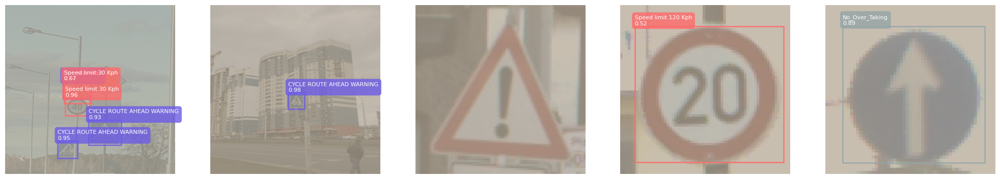

In [75]:
def visualize_clean_predictions(model, dataset, class_names, num_samples=5, device='cuda', confidence_threshold=0.5):
    model.eval()
    
    # Create a figure with adequate size and spacing
    fig = plt.figure(figsize=(20, 4))
    fig.patch.set_facecolor('white')
    
    # Custom colors for different sign types
    color_map = {
        'Speed limit': '#FF6B6B',    # Red tone
        'Stop': '#4ECDC4',           # Teal
        'Warning': '#FFD93D',        # Yellow
        'No': '#95A5A6',            # Grey
        'Crosswalk': '#2ECC71',      # Green
        'default': '#6C5CE7'         # Purple
    }
    
    # Select random samples
    random_indices = np.random.choice(len(dataset), num_samples, replace=False)
    
    for idx, sample_idx in enumerate(random_indices):
        # Create subplot
        ax = plt.subplot(1, num_samples, idx + 1)
        ax.set_facecolor('white')
        
        # Get image
        image, _ = dataset[sample_idx]
        image = image.unsqueeze(0).to(device)
        
        # Get predictions
        with torch.no_grad():
            predictions = model(image)
            pred = predictions[0]
        
        # Convert image for display
        image = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        image = (image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])).clip(0, 1)
        
        # Display image with slight brightness adjustment for better visibility
        plt.imshow(image * 1.1)
        
        # Get predictions above threshold
        keep = pred['scores'].cpu().numpy() > confidence_threshold
        boxes = pred['boxes'].cpu().numpy()[keep]
        scores = pred['scores'].cpu().numpy()[keep]
        labels = pred['labels'].cpu().numpy()[keep]
        
        # Draw predictions
        for box, score, label in zip(boxes, scores, labels):
            pred_label = class_names[label - 1]
            
            # Determine box color based on sign type
            color = next((v for k, v in color_map.items() if k in pred_label), color_map['default'])
            
            # Draw box with rounded corners
            x1, y1, x2, y2 = box
            width = x2 - x1
            height = y2 - y1
            
            # Create rectangle patch with alpha for semi-transparency
            rect = plt.Rectangle((x1, y1), width, height,
                               fill=False, 
                               linewidth=2,
                               edgecolor=color,
                               alpha=0.8)
            ax.add_patch(rect)
            
            # Create text box with prediction info
            text = f'{pred_label}\n{score:.2f}'
            text_box = ax.text(x1, y1 - 5, text,
                             fontsize=8,
                             color='white',
                             bbox=dict(
                                 facecolor=color,
                                 edgecolor='none',
                                 alpha=0.8,
                                 pad=3,
                                 boxstyle='round,pad=0.5'
                             ))
            
            # Adjust text box position if too close to top
            if y1 < 30:
                text_box.set_y(y2 + 5)
        
        # Remove axes for cleaner look
        ax.axis('off')
        
        # Add subtle border around the image
        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        for spine in ax.spines.values():
            spine.set_color('#dddddd')
            spine.set_linewidth(1)
    
    # Adjust layout
    plt.tight_layout(pad=2.0)
    plt.show()
    return fig

# Example usage:
print("Visualizing clean predictions on test set:")
fig = visualize_clean_predictions(model, test_dataset, class_names)